In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

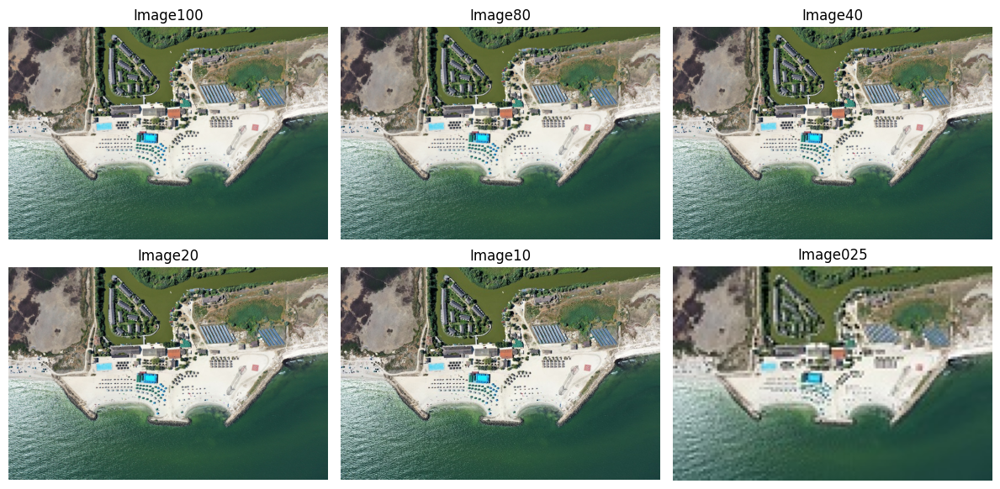

In [ ]:
image_files = ['/content/sample_data/Gura_Portitei_Scara_100.jpg',
               '/content/sample_data/Gura_Portitei_Scara_080.jpg',
               '/content/sample_data/Gura_Portitei_Scara_040.jpg',
               '/content/sample_data/Gura_Portitei_Scara_020.jpg',
               '/content/sample_data/Gura_Portitei_Scara_010.jpg',
               '/content/sample_data/Gura_Portitei_Scara_0025.jpg']
image_names = ['Image100', 'Image80', 'Image40', 'Image20', 'Image10','Image025']

images = []

for image_file, image_name in zip(image_files, image_names):
    image = cv2.imread(image_file)
    if image is not None:
        images.append((image_name, image))

rows, cols = 2, 3
fig, axes = plt.subplots(rows, cols, figsize=(12, 6))

for i, (name, image) in enumerate(images):
    row = i // cols
    col = i % cols
    axes[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    axes[row, col].axis('off')
    axes[row, col].set_title(name)

plt.tight_layout()
plt.show()

In [ ]:
sigma7=1
sigma13=2
sigma19=3


gaussian_filter_7x7 = np.fromfunction(
    lambda x, y: (1 / (2 * np.pi * sigma7 ** 2)) * np.exp(-((x - 7 // 2) ** 2 + (y - 7 // 2) ** 2) / (2 * sigma7 ** 2)),
    (7, 7))
gaussian_filter_13x13 = np.fromfunction(
    lambda x, y: (1 / (2 * np.pi * sigma13 ** 2)) * np.exp(-((x - 13 // 2) ** 2 + (y - 13 // 2) ** 2) / (2 * sigma13 ** 2)),
    (13, 13))
gaussian_filter_19x19 = np.fromfunction(
    lambda x, y: (1 / (2 * np.pi * sigma19 ** 2)) * np.exp(-((x - 19 // 2) ** 2 + (y - 19 // 2) ** 2) / (2 * sigma19 ** 2)),
    (19, 19))

gaussian_filter_7x7 /= np.sum(gaussian_filter_7x7)
gaussian_filter_13x13 /= np.sum(gaussian_filter_13x13)
gaussian_filter_19x19 /= np.sum(gaussian_filter_19x19)

In [ ]:
np.around(gaussian_filter_7x7, decimals=4)

array([[0.    , 0.0002, 0.0011, 0.0018, 0.0011, 0.0002, 0.    ],
       [0.0002, 0.0029, 0.0131, 0.0216, 0.0131, 0.0029, 0.0002],
       [0.0011, 0.0131, 0.0586, 0.0966, 0.0586, 0.0131, 0.0011],
       [0.0018, 0.0216, 0.0966, 0.1592, 0.0966, 0.0216, 0.0018],
       [0.0011, 0.0131, 0.0586, 0.0966, 0.0586, 0.0131, 0.0011],
       [0.0002, 0.0029, 0.0131, 0.0216, 0.0131, 0.0029, 0.0002],
       [0.    , 0.0002, 0.0011, 0.0018, 0.0011, 0.0002, 0.    ]])

In [ ]:
def convolve(image, kernel):
    img_height, img_width= image.shape
    kernel_height, kernel_width = kernel.shape

    pad_height = kernel_height // 2
    pad_width = kernel_width // 2

    padded_image = np.pad(image, ((pad_height, pad_height), (pad_width, pad_width)), mode='constant')

    output_image = np.zeros_like(image)

    for i in range(img_height):
        for j in range(img_width):
            output_image[i, j] = np.sum(padded_image[i:i + kernel_height, j:j + kernel_width] * kernel)

    return output_image

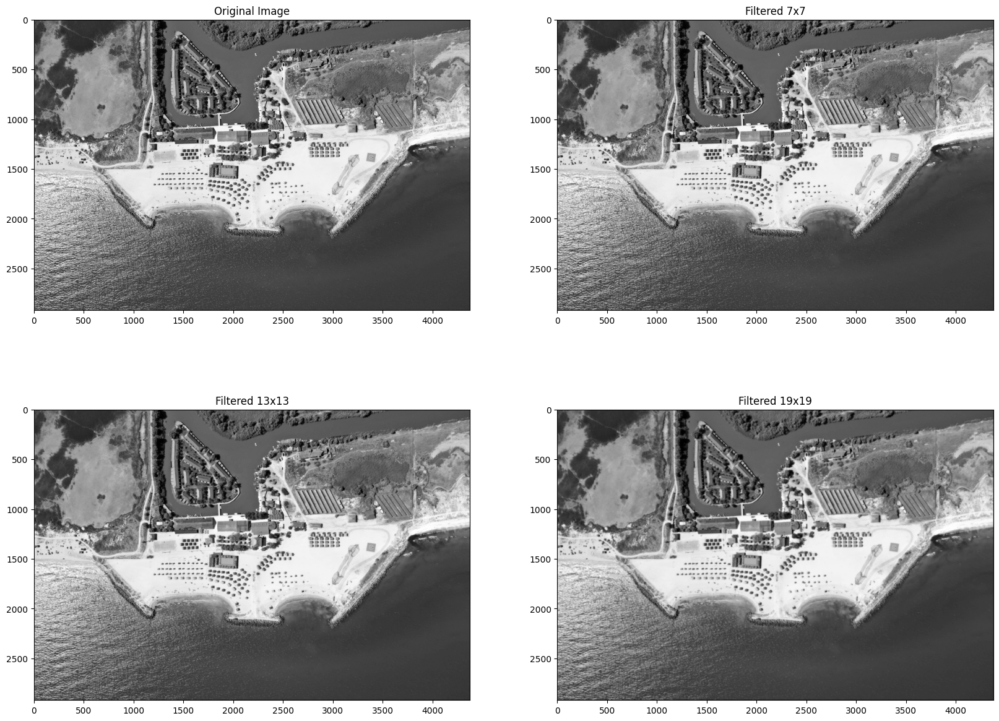

In [ ]:
img1 = cv2.imread('/content/sample_data/Gura_Portitei_Scara_080.jpg',cv2.IMREAD_GRAYSCALE)

filtered_7 = convolve(img1, gaussian_filter_7x7)
filtered_13 = convolve(img1, gaussian_filter_13x13)
filtered_19 = convolve(img1, gaussian_filter_19x19)

plt.figure(figsize=(20, 15))
plt.subplot(221), plt.imshow(img1, cmap='gray'), plt.title('Original Image')
plt.subplot(222), plt.imshow(filtered_7, cmap='gray'), plt.title('Filtered 7x7')
plt.subplot(223), plt.imshow(filtered_13, cmap='gray'), plt.title('Filtered 13x13')
plt.subplot(224), plt.imshow(filtered_19, cmap='gray'), plt.title('Filtered 19x19')
plt.show()

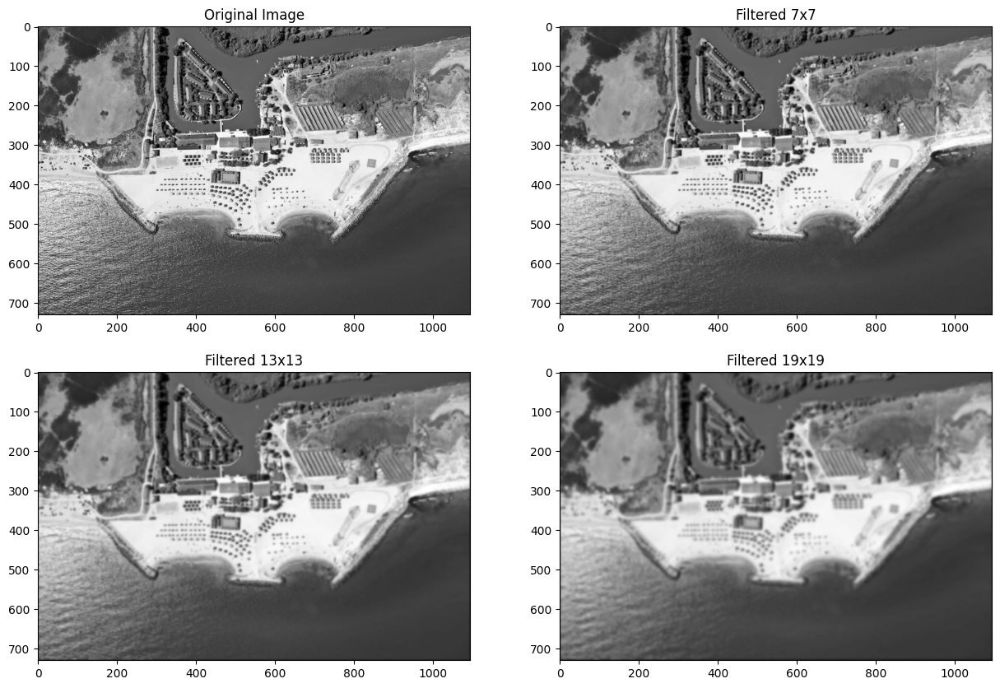

In [ ]:
img2 = cv2.imread('/content/sample_data/Gura_Portitei_Scara_020.jpg',cv2.IMREAD_GRAYSCALE)

filtered_7 = convolve(img2, gaussian_filter_7x7)
filtered_13 = convolve(img2, gaussian_filter_13x13)
filtered_19 = convolve(img2, gaussian_filter_19x19)

plt.figure(figsize=(15,10))
plt.subplot(221), plt.imshow(img2, cmap='gray'), plt.title('Original Image')
plt.subplot(222), plt.imshow(filtered_7, cmap='gray'), plt.title('Filtered 7x7')
plt.subplot(223), plt.imshow(filtered_13, cmap='gray'), plt.title('Filtered 13x13')
plt.subplot(224), plt.imshow(filtered_19, cmap='gray'), plt.title('Filtered 19x19')
plt.show()

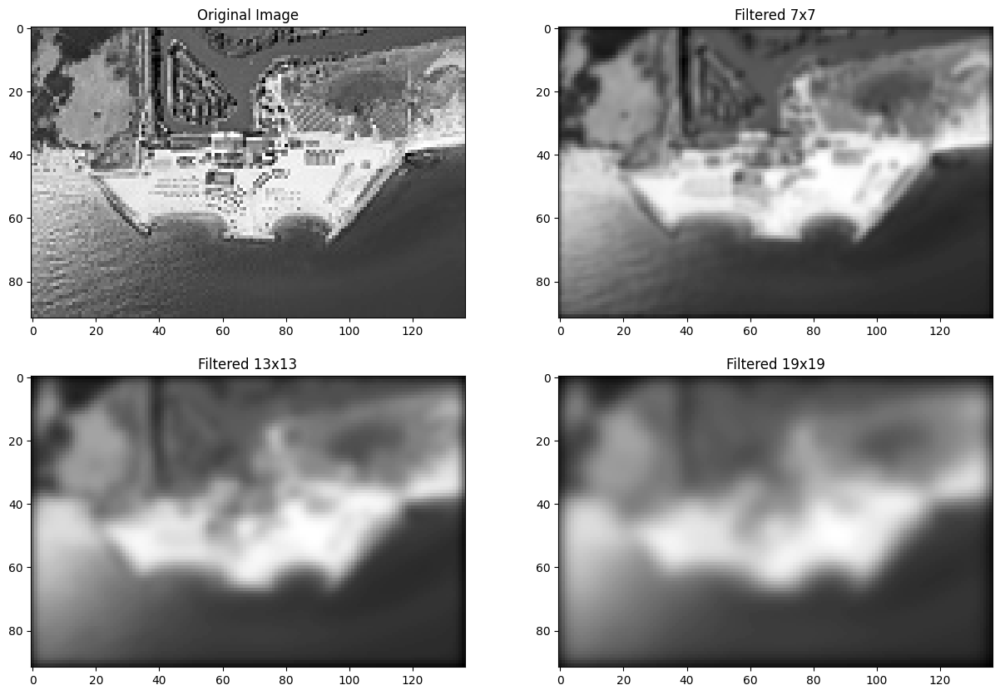

In [ ]:
img3 = cv2.imread('/content/sample_data/Gura_Portitei_Scara_0025.jpg',cv2.IMREAD_GRAYSCALE)

filtered_7 = convolve(img3, gaussian_filter_7x7)
filtered_13 = convolve(img3, gaussian_filter_13x13)
filtered_19 = convolve(img3, gaussian_filter_19x19)

plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(img3, cmap='gray'), plt.title('Original Image')
plt.subplot(222), plt.imshow(filtered_7, cmap='gray'), plt.title('Filtered 7x7')
plt.subplot(223), plt.imshow(filtered_13, cmap='gray'), plt.title('Filtered 13x13')
plt.subplot(224), plt.imshow(filtered_19, cmap='gray'), plt.title('Filtered 19x19')
plt.show()

In [ ]:
box_filter_7x7 = np.ones((7, 7)) / 49
box_filter_13x13 = np.ones((13, 13)) / 169
box_filter_19x19 = np.ones((19, 19)) / 361

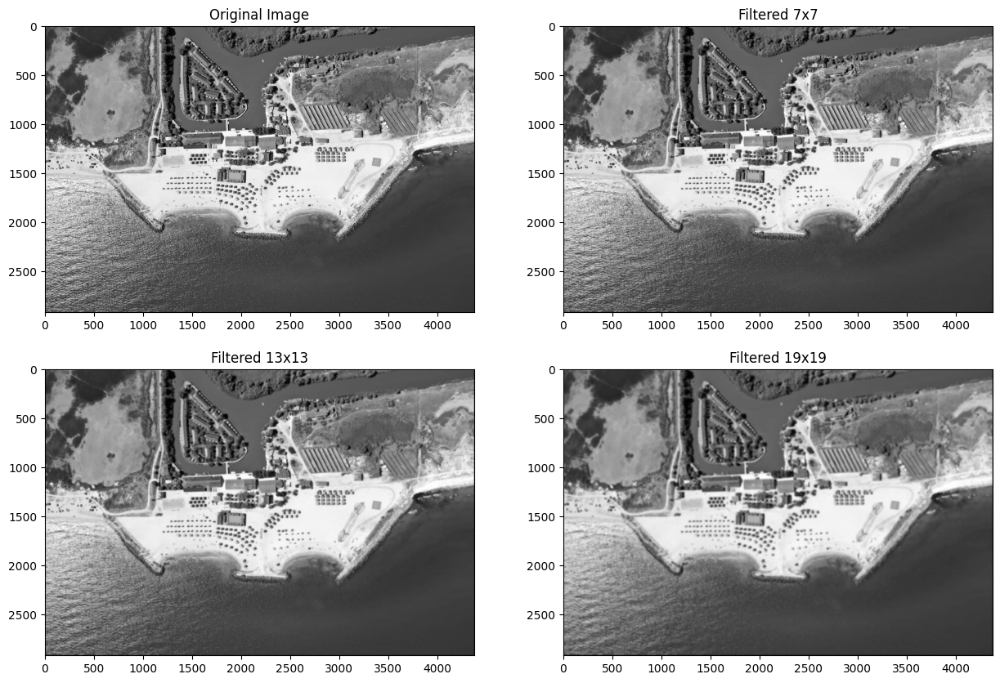

In [ ]:
box_filtered_7 = convolve(img1, box_filter_7x7)
box_filtered_13 = convolve(img1, box_filter_13x13)
box_filtered_19 = convolve(img1, box_filter_19x19)

plt.figure(figsize=(15,10))
plt.subplot(221), plt.imshow(img1, cmap='gray'), plt.title('Original Image')
plt.subplot(222), plt.imshow(box_filtered_7, cmap='gray'), plt.title('Filtered 7x7')
plt.subplot(223), plt.imshow(box_filtered_13, cmap='gray'), plt.title('Filtered 13x13')
plt.subplot(224), plt.imshow(box_filtered_19, cmap='gray'), plt.title('Filtered 19x19')
plt.show()

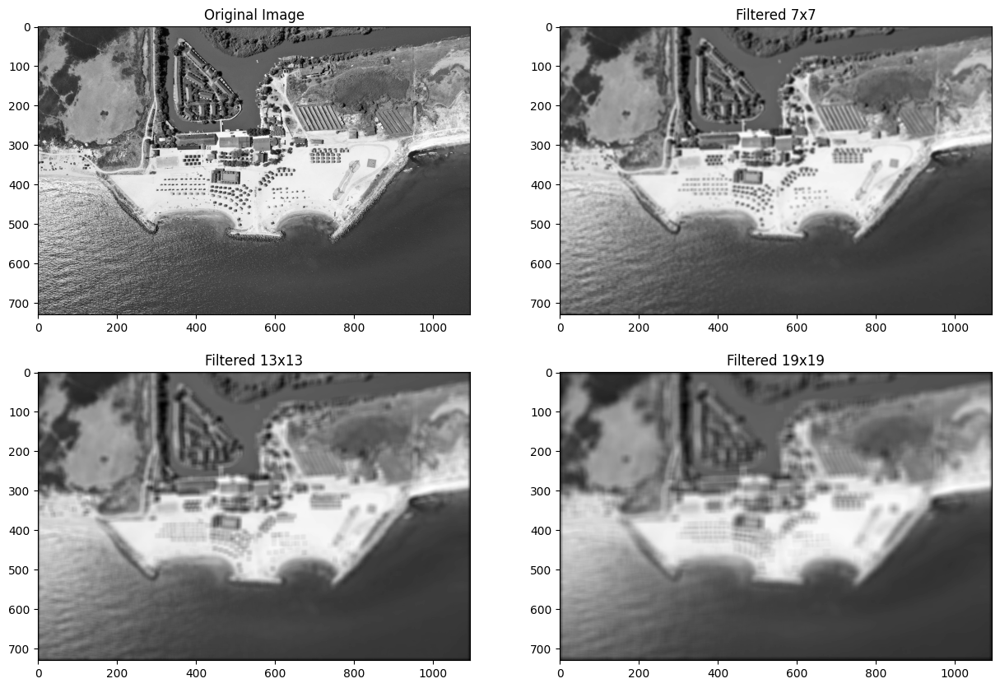

In [ ]:
box_filtered_7 = convolve(img2, box_filter_7x7)
box_filtered_13 = convolve(img2, box_filter_13x13)
box_filtered_19 = convolve(img2, box_filter_19x19)

plt.figure(figsize=(15,10))
plt.subplot(221), plt.imshow(img2, cmap='gray'), plt.title('Original Image')
plt.subplot(222), plt.imshow(box_filtered_7, cmap='gray'), plt.title('Filtered 7x7')
plt.subplot(223), plt.imshow(box_filtered_13, cmap='gray'), plt.title('Filtered 13x13')
plt.subplot(224), plt.imshow(box_filtered_19, cmap='gray'), plt.title('Filtered 19x19')
plt.show()

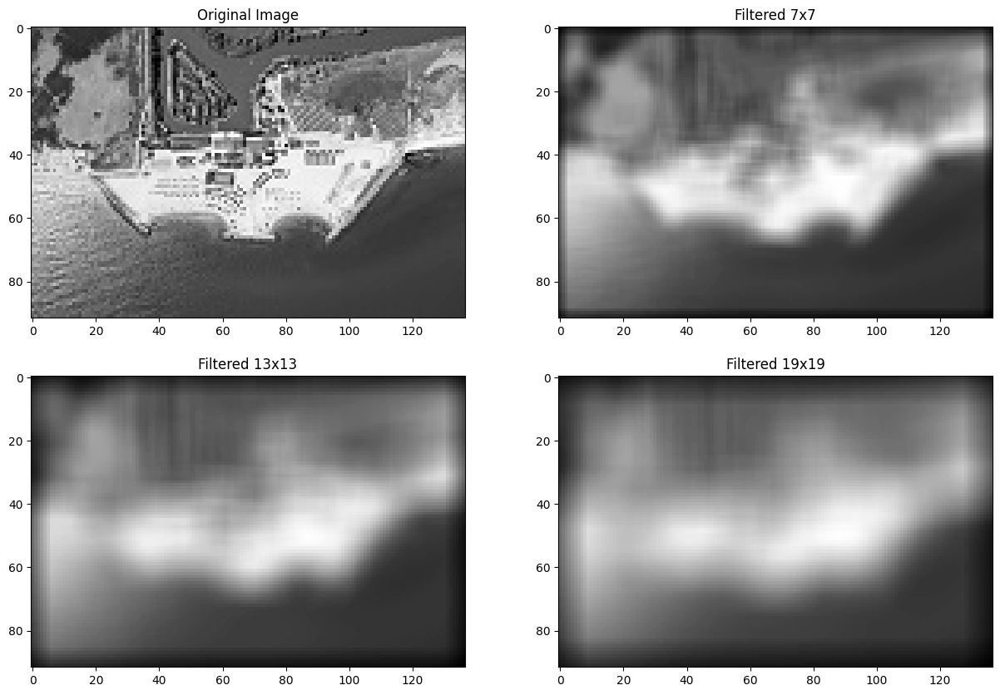

In [ ]:
box_filtered_7 = convolve(img3, box_filter_7x7)
box_filtered_13 = convolve(img3, box_filter_13x13)
box_filtered_19 = convolve(img3, box_filter_19x19)

plt.figure(figsize=(15,10))
plt.subplot(221), plt.imshow(img3, cmap='gray'), plt.title('Original Image')
plt.subplot(222), plt.imshow(box_filtered_7, cmap='gray'), plt.title('Filtered 7x7')
plt.subplot(223), plt.imshow(box_filtered_13, cmap='gray'), plt.title('Filtered 13x13')
plt.subplot(224), plt.imshow(box_filtered_19, cmap='gray'), plt.title('Filtered 19x19')
plt.show()

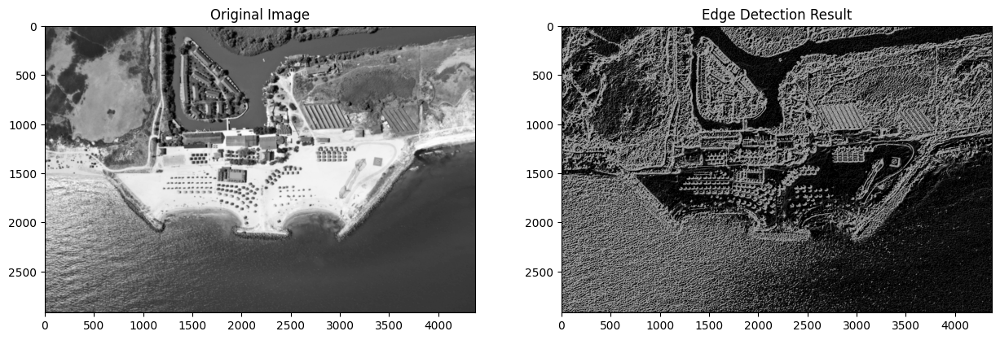

In [ ]:
img4 = cv2.imread('/content/sample_data/Gura_Portitei_Scara_080.jpg',cv2.IMREAD_GRAYSCALE)
img_filtered=convolve(img4,gaussian_filter_19x19)

sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

edges_x = cv2.filter2D(img_filtered, -1, sobel_x)
edges_y = cv2.filter2D(img_filtered, -1, sobel_y)

edges_magnitude = np.sqrt(edges_x**2 + edges_y**2)


plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(img_filtered, cmap='gray'), plt.title('Original Image')
plt.subplot(122), plt.imshow(edges_magnitude, cmap='gray'), plt.title('Edge Detection Result')
plt.show()

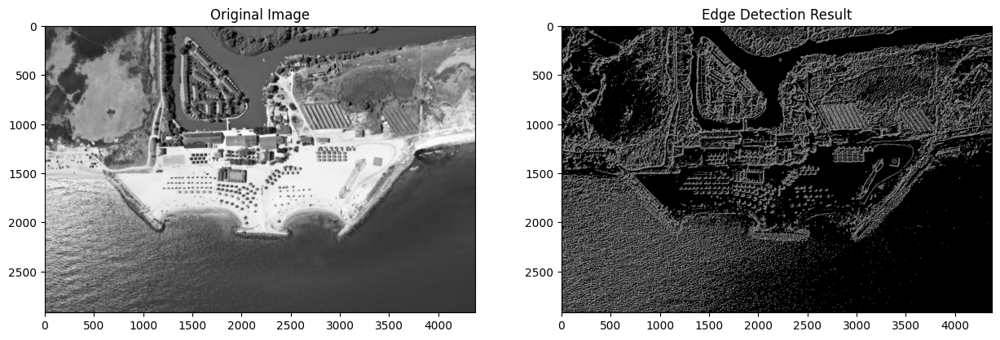

In [ ]:
threshold =11

edges_binary = (edges_magnitude > threshold).astype(np.uint8) * 255

plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(img_filtered, cmap='gray'), plt.title('Original Image')
plt.subplot(122), plt.imshow(edges_binary, cmap='gray'), plt.title('Edge Detection Result')
plt.show()

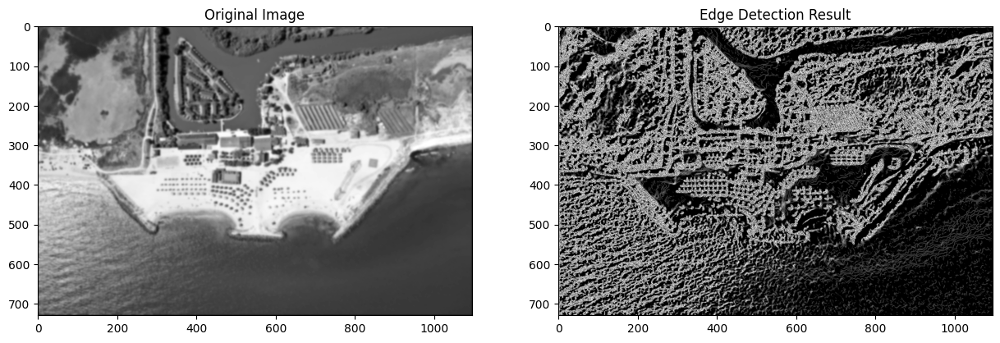

In [ ]:
img5 = cv2.imread('/content/sample_data/Gura_Portitei_Scara_020.jpg',cv2.IMREAD_GRAYSCALE)
img_filtered2=convolve(img5,gaussian_filter_13x13)

edges_x2 = cv2.filter2D(img_filtered2, -1, sobel_x)
edges_y2 = cv2.filter2D(img_filtered2, -1, sobel_y)

edges_magnitude2 = np.sqrt(edges_x2**2 + edges_y2**2)


plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(img_filtered2, cmap='gray'), plt.title('Original Image')
plt.subplot(122), plt.imshow(edges_magnitude2, cmap='gray'), plt.title('Edge Detection Result')
plt.show()

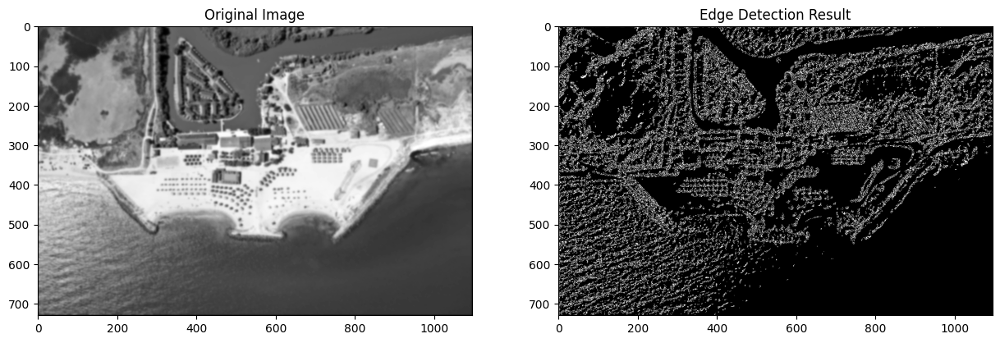

In [ ]:
threshold2 =12

edges_binary2 = (edges_magnitude2 > threshold2).astype(np.uint8) * 255

plt.figure(figsize=(15, 10))
plt.subplot(121), plt.imshow(img_filtered2, cmap='gray'), plt.title('Original Image')
plt.subplot(122), plt.imshow(edges_binary2, cmap='gray'), plt.title('Edge Detection Result')
plt.show()

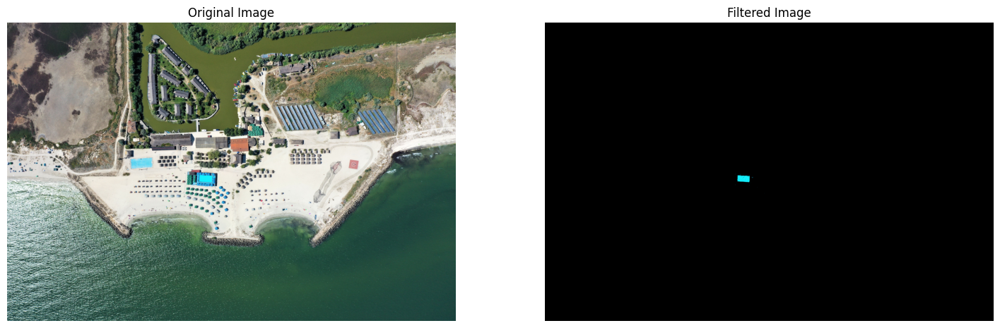

In [ ]:
newimg = cv2.imread('/content/sample_data/Gura_Portitei_Scara_080.jpg',cv2.IMREAD_COLOR)
hsv_image = cv2.cvtColor(newimg, cv2.COLOR_BGR2HSV)

lower_color = np.array([85, 230, 240])
upper_color = np.array([105, 255, 255])

mask = cv2.inRange(hsv_image, lower_color, upper_color)

result = cv2.bitwise_and(newimg, newimg, mask=mask)

plt.figure(figsize=(18, 9))

plt.subplot(121)
plt.imshow(cv2.cvtColor(newimg, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.subplot(122)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Filtered Image')
plt.axis('off')

plt.show()

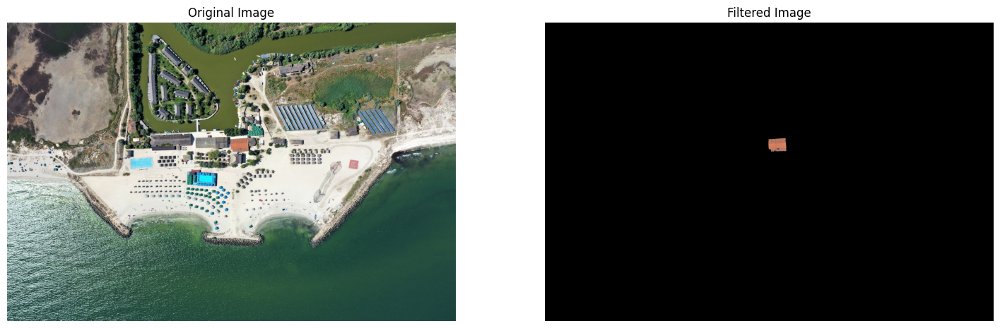

In [ ]:
lower_color2 = np.array([3, 85, 0])
upper_color2 = np.array([11, 180, 255])

mask2 = cv2.inRange(hsv_image, lower_color2, upper_color2)

num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(mask2, connectivity=8)
min_component_size = 700
filtered_mask = np.zeros_like(mask2)
for label in range(1, num_labels):
    if stats[label, cv2.CC_STAT_AREA] > min_component_size:
        filtered_mask[labels == label] = 255

result2 = cv2.bitwise_and(newimg, newimg, mask=filtered_mask)

plt.figure(figsize=(18, 9))

plt.subplot(121)
plt.imshow(cv2.cvtColor(newimg, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.subplot(122)
plt.imshow(cv2.cvtColor(result2, cv2.COLOR_BGR2RGB))
plt.title('Filtered Image')
plt.axis('off')

plt.show()

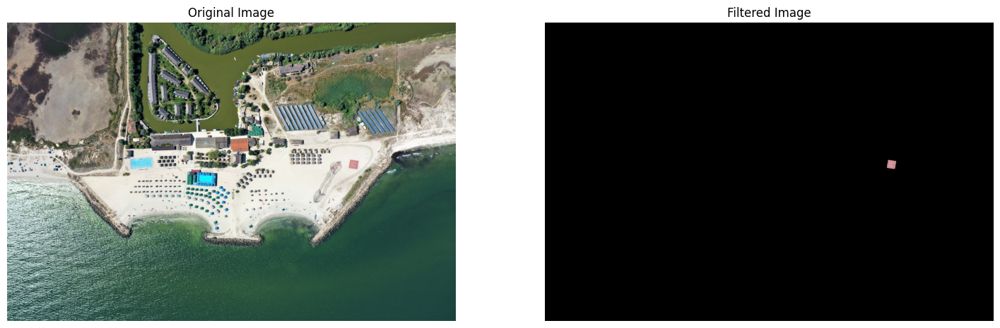

In [ ]:
lower_color_1 = np.array([0, 65, 200])
upper_color_1 = np.array([5, 95, 220])

lower_color_2 = np.array([175, 65, 200])
upper_color_2 = np.array([180, 95, 220])

mask_1 = cv2.inRange(hsv_image, lower_color_1, upper_color_1)
mask_2 = cv2.inRange(hsv_image, lower_color_2, upper_color_2)
combined_mask = cv2.bitwise_or(mask_1, mask_2)

kernel = np.ones((31, 31), np.uint8)
dilated_mask = cv2.dilate(combined_mask, kernel, iterations=1)
eroded_mask = cv2.erode(dilated_mask, kernel, iterations=1)

num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(eroded_mask, connectivity=8)
min_component_size = 200
res_mask = np.zeros_like(eroded_mask)
for label in range(1, num_labels):
    if stats[label, cv2.CC_STAT_AREA] > min_component_size:
        res_mask[labels == label] = 255



result3 = cv2.bitwise_and(newimg, newimg, mask=res_mask)

plt.figure(figsize=(18, 9))

plt.subplot(121)
plt.imshow(cv2.cvtColor(newimg, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.axis('off')
plt.subplot(122)
plt.imshow(cv2.cvtColor(result3, cv2.COLOR_BGR2RGB))
plt.title('Filtered Image')
plt.axis('off')

plt.show()